# Prasoon Mahawar - News Recommendation System

## Step 1: Data pre-processing

In [1]:
# Importing libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Loadind the data

consumer_transactions = pd.read_csv('./consumer_transanctions.csv', low_memory=False)
platform_content = pd.read_csv('./platform_content.csv', low_memory=False)

In [3]:
consumer_transactions.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2...,NY,US
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN


In [4]:
consumer_transactions.shape

(72312, 8)

In [5]:
consumer_transactions.dtypes

event_timestamp          int64
interaction_type        object
item_id                  int64
consumer_id              int64
consumer_session_id     object
consumer_device_info    object
consumer_location       object
country                 object
dtype: object

In [6]:
platform_content.head()

,event_timestamp,interaction_type,item_id,producer_id,producer_session_id,producer_device_info,producer_location,producer_country,item_type,item_url,title,text_description,language
0,1459192779,content_pulled_out,-6451309518266745024,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
1,1459193988,content_present,-4110354420726924665,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,1459194146,content_present,-7292285110016212249,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,1459194474,content_present,-6151852268067518688,3891637997717104548,-1457532940883382585,NaN,NaN,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,1459194497,content_present,2448026894306402386,4340306774493623681,8940341205206233829,NaN,NaN,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en


In [7]:
platform_content.shape

(3122, 13)

In [8]:
platform_content.dtypes

event_timestamp          int64
interaction_type        object
item_id                  int64
producer_id              int64
producer_session_id      int64
producer_device_info    object
producer_location       object
producer_country        object
item_type               object
item_url                object
title                   object
text_description        object
language                object
dtype: object

In [9]:
consumer_transactions['interaction_type'].value_counts()

interaction_type
content_watched         61086
content_liked            5745
content_saved            2463
content_commented_on     1611
content_followed         1407
Name: count, dtype: int64

In [10]:
# Imputing the ratings value based on the interaction type
# The weightage will be in this order content_followed -> content_commented_on -> content_saved -> content_liked -> content_watched

# Defining a function to map interaction_type values to ratings
def map_interaction_to_rating(interaction_type):
    if interaction_type == 'content_followed':
        return 5
    elif interaction_type == 'content_commented_on':
        return 4
    elif interaction_type == 'content_saved':
        return 3
    elif interaction_type == 'content_liked':
        return 2
    elif interaction_type == 'content_watched':
        return 1
    else:
        return None  # or any other default value

# Creating the 'ratings' column based on 'interaction_type'
consumer_transactions['ratings'] = consumer_transactions['interaction_type'].apply(map_interaction_to_rating)

In [11]:
consumer_transactions.head()

,event_timestamp,interaction_type,item_id,consumer_id,consumer_session_id,consumer_device_info,consumer_location,country,ratings
0,1465413032,content_watched,-3499919498720038879,-8845298781299428018,1264196770339959068,NaN,NaN,NaN,1
1,1465412560,content_watched,8890720798209849691,-1032019229384696495,3621737643587579081,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_2...,NY,US,1
2,1465416190,content_watched,310515487419366995,-1130272294246983140,2631864456530402479,NaN,NaN,NaN,1
3,1465413895,content_followed,310515487419366995,344280948527967603,-3167637573980064150,NaN,NaN,NaN,5
4,1465412290,content_watched,-7820640624231356730,-445337111692715325,561148 1178424124714,NaN,NaN,NaN,1


In [12]:
consumer_transactions['ratings'].value_counts()

ratings
1    61086
2     5745
3     2463
4     1611
5     1407
Name: count, dtype: int64

### Removing unwanted columns from both the dataframes

In [13]:
consumer_transactions.drop(['event_timestamp','consumer_session_id','consumer_device_info'],inplace=True, axis=1)

In [14]:
consumer_transactions.shape

(72312, 6)

In [15]:
platform_content.drop(['event_timestamp','producer_id','producer_session_id','producer_location','producer_device_info'],inplace=True, axis=1)

In [16]:
# Filtering platform_content for getting articles with english language and removing pulled out content

platform_content_en = platform_content[platform_content['language'] == 'en']
platform_content_en = platform_content_en[platform_content_en['interaction_type'] != 'content_pulled_out']
platform_content_en.head()

,interaction_type,item_id,producer_country,item_type,item_url,title,text_description,language
1,content_present,-4110354420726924665,NaN,HTML,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,content_present,-7292285110016212249,NaN,HTML,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,content_present,-6151852268067518688,NaN,HTML,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,content_present,2448026894306402386,NaN,HTML,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en
5,content_present,-2826566343807132236,NaN,HTML,http://www.coindesk.com/ieee-blockchain-oxford...,IEEE to Talk Blockchain at Cloud Computing Oxf...,One of the largest and oldest organizations fo...,en


In [17]:
platform_content_en.shape

(2211, 8)

## Step 2 - Exploratory Data Analysis

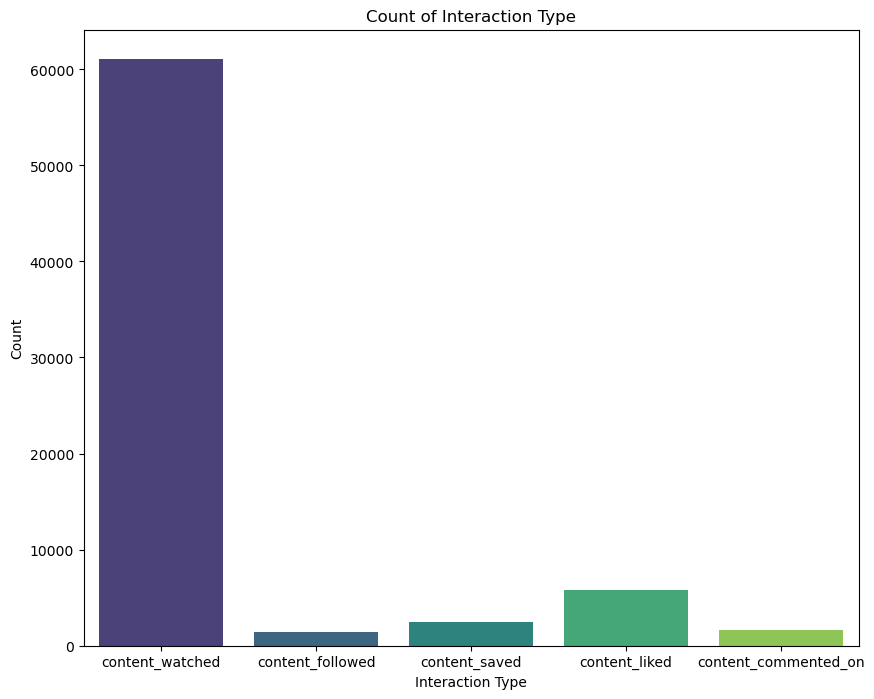

In [18]:
# Exploring various features present in the dataset for their distribution
plt.figure(figsize=(10, 8))
sns.countplot(x='interaction_type', data=consumer_transactions, palette='viridis')
plt.xlabel('Interaction Type')
plt.ylabel('Count')
plt.title('Count of Interaction Type')
plt.show()

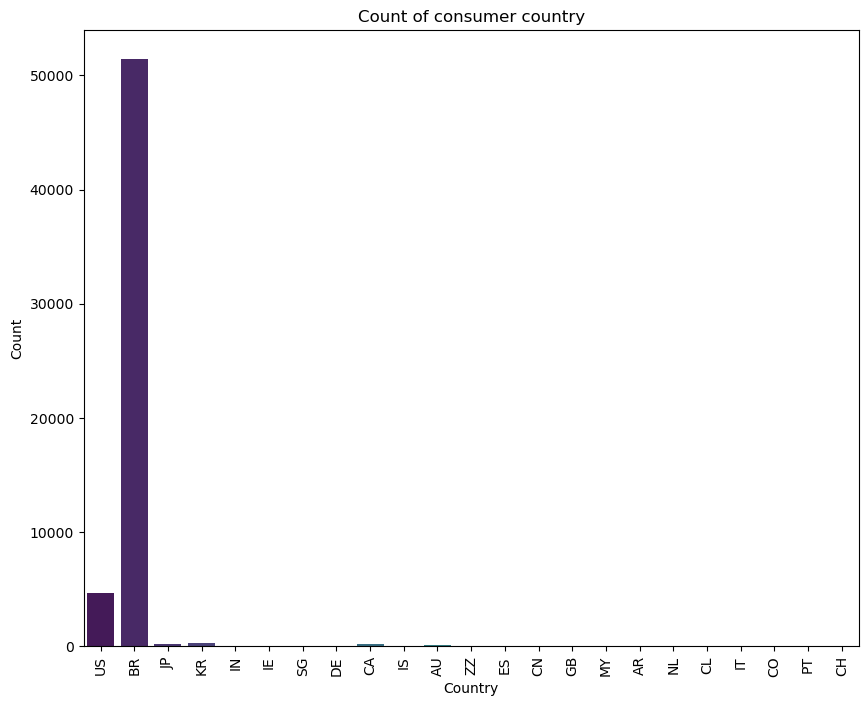

In [19]:
plt.figure(figsize=(10, 8))
sns.countplot(x='country', data=consumer_transactions, palette='viridis')
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Count of consumer country')
plt.xticks(rotation=90)
plt.show()


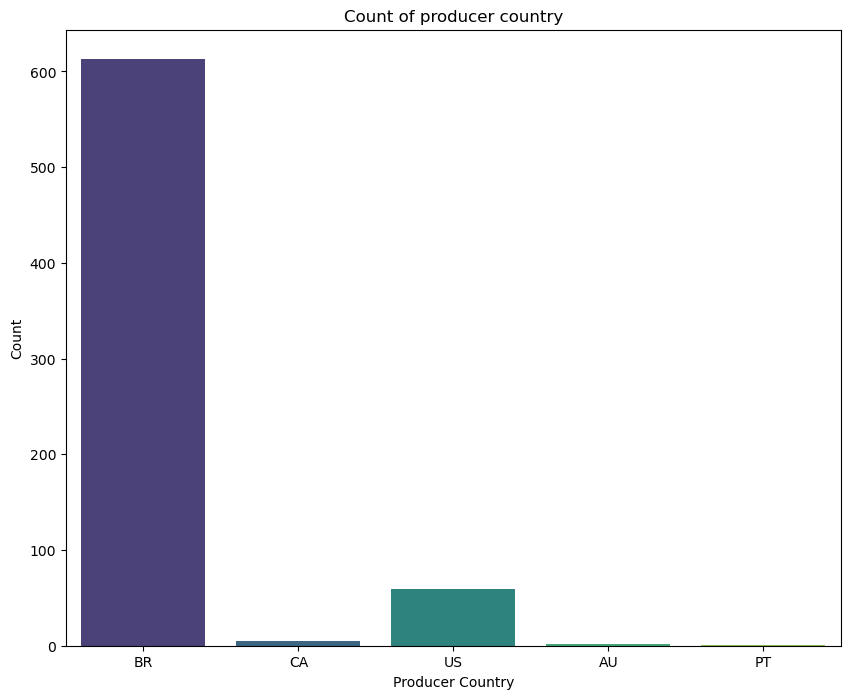

In [20]:
plt.figure(figsize=(10, 8))
sns.countplot(x='producer_country', data=platform_content, palette='viridis')
plt.xlabel('Producer Country')
plt.ylabel('Count')
plt.title('Count of producer country')
plt.show()

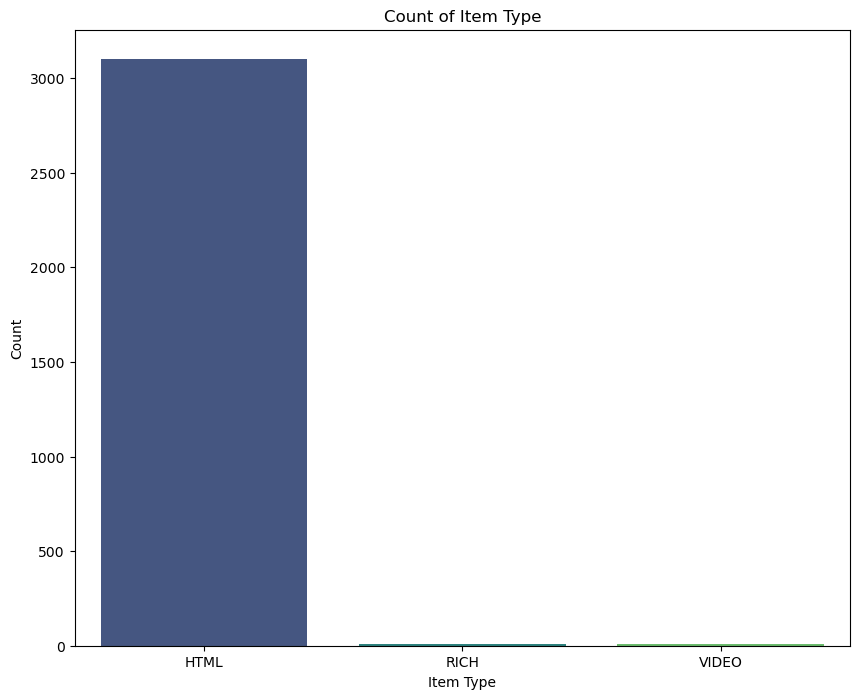

In [21]:
plt.figure(figsize=(10, 8))
sns.countplot(x='item_type', data=platform_content, palette='viridis')
plt.xlabel('Item Type')
plt.ylabel('Count')
plt.title('Count of Item Type')
plt.show()

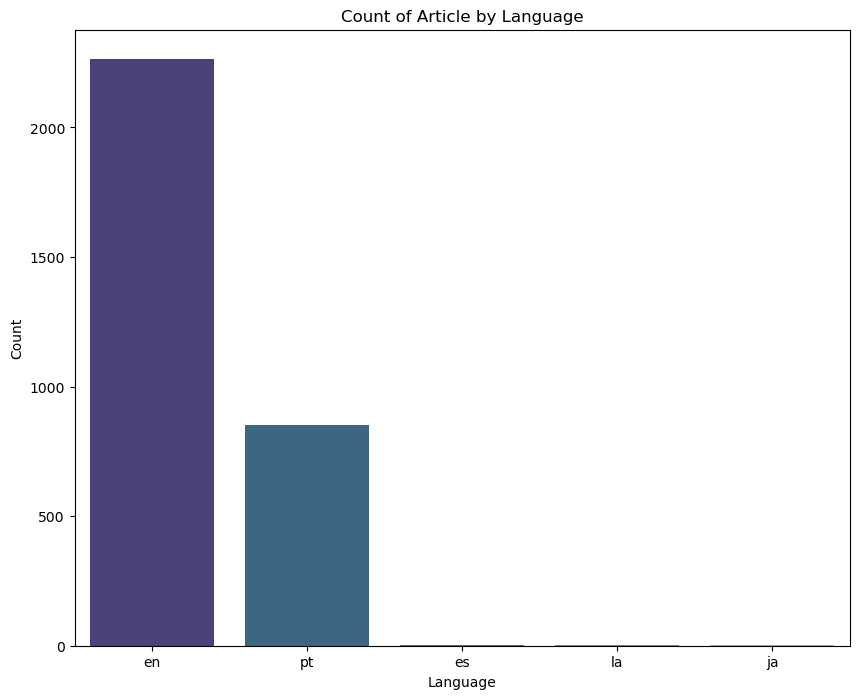

In [22]:
plt.figure(figsize=(10, 8))
sns.countplot(x='language', data=platform_content, palette='viridis')
plt.xlabel('Language')
plt.ylabel('Count')
plt.title('Count of Article by Language')
plt.show()

### Observations

- Most interaction by users is just watching the content
- Most consumers are from country Brazil
- Most producers are als from coutry Brazil
- Most of the content is published in HTML format
- Most of the content is in english language

### Further dropping more unwanted columns after performing EDA

In [23]:
consumer_df_cleaned = consumer_transactions.drop(['interaction_type','consumer_location','country'], axis=1)

In [24]:
consumer_df_cleaned.shape

(72312, 3)

In [25]:
consumer_df_cleaned.head()

,item_id,consumer_id,ratings
0,-3499919498720038879,-8845298781299428018,1
1,8890720798209849691,-1032019229384696495,1
2,310515487419366995,-1130272294246983140,1
3,310515487419366995,344280948527967603,5
4,-7820640624231356730,-445337111692715325,1


In [26]:
content_df_cleaned = platform_content_en.drop(['producer_country','item_type'], axis=1)

In [27]:
content_df_cleaned.shape

(2211, 6)

In [28]:
content_df_cleaned.head()

,interaction_type,item_id,item_url,title,text_description,language
1,content_present,-4110354420726924665,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,content_present,-7292285110016212249,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,content_present,-6151852268067518688,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,content_present,2448026894306402386,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en
5,content_present,-2826566343807132236,http://www.coindesk.com/ieee-blockchain-oxford...,IEEE to Talk Blockchain at Cloud Computing Oxf...,One of the largest and oldest organizations fo...,en


## Step 3 - Recommendation Techniques

In [29]:
#Lets consider the consumer with consumer id 2653698047369148236
consumer_to_be_considered_Id = 2653698047369148236

## Problem Statement 1 -  Recommend new top 10 relevant articles to a user when he visits the app at the start of the day

### User based collaborative Filtering

In [30]:
consumer_df_cleaned.head()

,item_id,consumer_id,ratings
0,-3499919498720038879,-8845298781299428018,1
1,8890720798209849691,-1032019229384696495,1
2,310515487419366995,-1130272294246983140,1
3,310515487419366995,344280948527967603,5
4,-7820640624231356730,-445337111692715325,1


In [31]:
n_consumers = consumer_df_cleaned.consumer_id.nunique()

n_items = consumer_df_cleaned.item_id.nunique()

In [32]:
n_consumers

1895

In [33]:
n_items

2987

#### Splittng train and test set

In [34]:

from sklearn.model_selection import train_test_split
train, test = train_test_split(consumer_df_cleaned, test_size=0.30, random_state=31)

In [35]:
print(train.shape)
print(test.shape)

(50618, 3)
(21694, 3)


#### Create empty data matrix: consumer*item

In [36]:
data_matrix = np.zeros((n_consumers, n_items))

In [37]:
data_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [38]:
data_matrix.shape   

(1895, 2987)

#### Fill consumer*item Train matrix with rating values

In [39]:
''' Since the values of item_id and consumer_id are very large 
 and some are negative as so we can create a mapping for those '''

consumer_id_mapping = {}
item_id_mapping = {}
for line in train.itertuples():  
    if line.consumer_id not in consumer_id_mapping:
        consumer_id_mapping[line.consumer_id] = len(consumer_id_mapping)

    if line.item_id not in item_id_mapping:
        item_id_mapping[line.item_id] = len(item_id_mapping)

In [40]:
for line in train.itertuples():
    consumer_index = consumer_id_mapping[line.consumer_id]
    item_index = item_id_mapping[line.item_id]
    data_matrix[consumer_index, item_index] = line.ratings

In [41]:
data_matrix.shape

(1895, 2987)

#### Create Data Matrix with Test Data

In [42]:
data_matrix_test = np.zeros((n_consumers, n_items))

In [43]:
consumer_id_mapping_test = {}
item_id_mapping_test = {}

for line in test.itertuples():  
    if line.consumer_id not in consumer_id_mapping_test:
        consumer_id_mapping_test[line.consumer_id] = len(consumer_id_mapping_test)

    if line.item_id not in item_id_mapping_test:
        item_id_mapping_test[line.item_id] = len(item_id_mapping_test)

In [44]:
for line in test.itertuples():
    consumer_index = consumer_id_mapping_test[line.consumer_id]
    item_index = item_id_mapping_test[line.item_id]
    data_matrix_test[consumer_index, item_index] = line.ratings

In [45]:
data_matrix_test.shape

(1895, 2987)

#### Create Data Matrix with Full Data

In [46]:
data_matrix_full = np.zeros((n_consumers, n_items))

In [47]:
consumer_id_mapping_full = {}
item_id_mapping_full = {}

for line in consumer_df_cleaned.itertuples():  
    if line.consumer_id not in consumer_id_mapping_full:
        consumer_id_mapping_full[line.consumer_id] = len(consumer_id_mapping_full)

    if line.item_id not in item_id_mapping_full:
        item_id_mapping_full[line.item_id] = len(item_id_mapping_full)

In [48]:
for line in consumer_df_cleaned.itertuples():
    consumer_index = consumer_id_mapping_full[line.consumer_id]
    item_index = item_id_mapping_full[line.item_id]
    data_matrix_full[consumer_index, item_index] = line.ratings

In [49]:
data_matrix_full[0]

array([1., 3., 0., ..., 0., 0., 0.])

In [50]:
def get_key_from_value_for_consumer(consumer_id):
    for key, value in consumer_id_mapping_full.items():
        if value == consumer_id:
            return key
        
def get_key_from_value_for_item(item_id):
    for key, value in item_id_mapping_full.items():
        if value == item_id:
            return key

In [51]:
# function to remove the news articles already visited by user
def removing_news_articles_already_seen_by_user(recom_df,consumer_id):
    df_user = pd.DataFrame(data_matrix_full[consumer_id_mapping_full[consumer_id]], columns=['ratings'])
    df_user = df_user.reset_index()
    df_user.columns = ['item_id', 'ratings']
    df_user['ratings'] = df_user['ratings'].astype(int)
    df_user['item_id'] = df_user['item_id'].apply(get_key_from_value_for_item)
    merged_collab = pd.merge(recom_df, df_user, on='item_id', how='inner')
    merged_collab = merged_collab.drop(merged_collab[merged_collab['ratings']>0].index)
    return merged_collab

#### Calculating user-similarity matrix using Pairwise Distance

In [52]:
from sklearn.metrics.pairwise import pairwise_distances 

In [53]:
user_similarity = 1- pairwise_distances(data_matrix, metric='cosine')

In [54]:
user_similarity.shape

(1895, 1895)

In [55]:
data_matrix.T.shape

(2987, 1895)

#### Generating Predicting rating for all user-item pairs

In [56]:
item_prediction = np.dot(user_similarity, data_matrix_test)

In [57]:
item_prediction

array([[3.66198247, 1.60595138, 0.70687235, ..., 0.        , 0.        ,
        0.        ],
       [0.24370029, 1.20491115, 0.2450342 , ..., 0.        , 0.        ,
        0.        ],
       [1.51199206, 1.42170514, 3.251214  , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [58]:
prediction_df = pd.DataFrame(item_prediction)

In [59]:
prediction_df.head()

,0,1,2,3,4,5,6,7,8,9,...,2977,2978,2979,2980,2981,2982,2983,2984,2985,2986
0,3.661982,1.605951,0.706872,3.527827,0.889936,0.394859,0.428010,0.123435,1.438280,0.509767,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.243700,1.204911,0.245034,1.356817,0.216811,0.061272,0.113415,0.081565,0.339400,0.185195,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.511992,1.421705,3.251214,6.910880,1.931576,0.161173,0.406398,0.227419,1.268427,0.427075,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.700490,1.551932,0.790801,5.565654,0.967534,0.242123,0.217803,0.310497,1.432669,0.295534,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.768437,0.320913,0.229052,2.677078,1.440703,0.348742,0.312828,0.149433,0.564130,0.228411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [60]:
recommended_news_df = pd.DataFrame(prediction_df.iloc[234].sort_values(ascending=False))

In [61]:
recommended_news_df.head()

,234
147,2.148509
759,2.116868
46,1.980434
23,1.712879
3,1.665848


In [62]:
# Creating a modular function for recommending news on the basis of user similartiy
def recommending_news_based_on_user_similarity(consumer_id):
    recommended_news_df = pd.DataFrame(prediction_df.iloc[consumer_id_mapping_full[consumer_id]].sort_values(ascending=False))
    recommended_news_df.reset_index(inplace=True)
    recommended_news_df.columns = ['item_id', 'score']
    recommended_news_df['item_id'] = recommended_news_df['item_id'].apply(get_key_from_value_for_item)
    merged_with_title = pd.merge(recommended_news_df, content_df_cleaned, on='item_id', how='left')
    # removing pulled out content
    merged_with_title = merged_with_title[merged_with_title['interaction_type'] != 'content_pulled_out']
    merged_with_title = merged_with_title[['item_id','title','score', 'language']]
    merged_with_title = merged_with_title.dropna(axis=0)
    return merged_with_title

In [63]:
news_as_per_user_similarity = removing_news_articles_already_seen_by_user(recommending_news_based_on_user_similarity(consumer_to_be_considered_Id),consumer_to_be_considered_Id)

In [64]:
news_as_per_user_similarity.head(10)

,item_id,title,score,language,ratings
0,6062146090334604102,Serverless Data Sync in Web Apps with Bit Torrent,2.148509,en,0
1,-5297634649735765167,Google is quietly making progress on one of it...,2.116868,en,0
2,-4095842175692097942,Google just open sourced something called 'Par...,1.980434,en,0
3,-692972306229904743,Blockchain won't kill banks: Bitcoin pioneer,1.712879,en,0
4,-7820640624231356730,How This Googler Redesigned The Workweek,1.665848,en,0
5,-5784228041033890044,[E-learning] Design Thinking for Innovation - ...,1.516847,en,0
6,-9100490342054218852,What Happens When You Combine Artificial Intel...,1.506271,en,0
7,-5976464170927897250,The Pulse of a City - Uber Engineering Blog,1.425385,en,0
8,3564394485543941353,Google Is About to Supercharge Its TensorFlow ...,1.403608,en,0
9,1449689399273695199,Facebook sends a loud message about Messenger ...,1.358739,en,0


### Item based collaborative Filtering

#### Calculating item-similarity matrix

In [65]:
item_similarity = 1-pairwise_distances(data_matrix, metric='cosine')

In [66]:
item_prediction_2 = np.dot(item_similarity, data_matrix_test)

In [67]:
prediction_df_2 = pd.DataFrame(item_prediction_2)

In [68]:
prediction_df_2.head()

,0,1,2,3,4,5,6,7,8,9,...,2977,2978,2979,2980,2981,2982,2983,2984,2985,2986
0,3.661982,1.605951,0.706872,3.527827,0.889936,0.394859,0.428010,0.123435,1.438280,0.509767,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.243700,1.204911,0.245034,1.356817,0.216811,0.061272,0.113415,0.081565,0.339400,0.185195,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.511992,1.421705,3.251214,6.910880,1.931576,0.161173,0.406398,0.227419,1.268427,0.427075,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.700490,1.551932,0.790801,5.565654,0.967534,0.242123,0.217803,0.310497,1.432669,0.295534,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.768437,0.320913,0.229052,2.677078,1.440703,0.348742,0.312828,0.149433,0.564130,0.228411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [69]:
# Creating a modular function for recommending news on the basis of item similartiy
def recommending_news_based_on_item_similarity(item_id):
    recommended_news_df = pd.DataFrame(prediction_df_2.iloc[item_id_mapping_full[item_id]].sort_values(ascending=False))
    recommended_news_df.reset_index(inplace=True)
    recommended_news_df.columns = ['item_id', 'score']
    # removing the item itself from the prediction
    recommended_news_df = recommended_news_df[recommended_news_df['item_id'] != item_id]
    recommended_news_df['item_id'] = recommended_news_df['item_id'].apply(get_key_from_value_for_item)
    merged_with_title = pd.merge(recommended_news_df, content_df_cleaned, on='item_id', how='left')
    # removing pulled out content
    merged_with_title = merged_with_title[merged_with_title['interaction_type'] != 'content_pulled_out']
    merged_with_title = merged_with_title[['item_id','title','score', 'language']]
    return merged_with_title

In [70]:
news_as_per_item_similarity = removing_news_articles_already_seen_by_user(recommending_news_based_on_item_similarity(6576356408780336784),consumer_to_be_considered_Id)

In [71]:
news_as_per_item_similarity.head(10)

,item_id,title,score,language,ratings
0,-3544655814153481738,New Africa Trend Briefing from TrendWatching |...,1.109727,en,0
1,-2176468683077766369,Facebook's New Mobile Test Framework Births Bo...,1.016755,en,0
2,3564394485543941353,Google Is About to Supercharge Its TensorFlow ...,1.005110,en,0
3,-1706114177222872702,The Spotify Tribe,1.000000,en,0
4,-6783772548752091658,NaN,0.952700,NaN,0
5,-4662020648308370136,How to Avoid Building Bad Products with Rapid ...,0.858468,en,0
6,2760023027553835473,How Blockchain Could Make Trusts More Transpar...,0.857151,en,0
7,5152069678055228801,IBM makes a big shift into cognitive computing,0.836403,en,0
8,-6514535768080218883,USB-C and Lightning headphones,0.836403,en,0
9,5934557073194045393,Google's Cloud Investments are Finally Startin...,0.836403,en,0


### ALS [Alternating Least Square]

#### Creating a sparse user-item matrix

In [72]:
from scipy.sparse import csr_matrix

In [73]:
alpha = 40

In [74]:
consumer_df_copy = consumer_df_cleaned.copy()

In [75]:
''' Since the values of item_id and consumer_id are very large 
 and some are negative as so we can create a mapping for those '''

consumer_id_mapping_als = {}
item_id_mapping_als = {}
for line in consumer_df_copy.itertuples():  
    if line.consumer_id not in consumer_id_mapping_als:
        consumer_id_mapping_als[line.consumer_id] = len(consumer_id_mapping_als)

    if line.item_id not in item_id_mapping_als:
        item_id_mapping_als[line.item_id] = len(item_id_mapping_als)

In [76]:
consumer_df_copy['consumer_id'] = consumer_df_copy['consumer_id'].apply(lambda x: consumer_id_mapping_als[x])

In [77]:
consumer_df_copy['item_id'] = consumer_df_copy['item_id'].apply(lambda x: item_id_mapping_als[x])

In [78]:
sparse_user_item = csr_matrix( ([alpha]*consumer_df_copy.shape[0], (consumer_df_copy['consumer_id'], consumer_df_copy['item_id']) ))

In [79]:
sparse_user_item

<1895x2987 sparse matrix of type '<class 'numpy.int64'>'
	with 40710 stored elements in Compressed Sparse Row format>

#### converting it to array

In [80]:
csr_user_array = sparse_user_item.toarray()

In [81]:
csr_user_array

array([[ 80,  80,   0, ...,   0,   0,   0],
       [  0, 400, 480, ...,   0,   0,   0],
       [  0, 120, 400, ...,   0,   0,   0],
       ...,
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]])

In [82]:
max(csr_user_array[1])

1160

In [83]:
print(sparse_user_item.shape)

(1895, 2987)


#### Creating a item-user sparse matrix

In [84]:
sparse_item_user = sparse_user_item.T.tocsr()

In [85]:
csr_item_array = sparse_item_user.toarray()

In [86]:
sparse_item_user

<2987x1895 sparse matrix of type '<class 'numpy.int64'>'
	with 40710 stored elements in Compressed Sparse Row format>

#### Create a test train split

In [87]:
!pip install implicit
import implicit
from implicit.evaluation import train_test_split

In [88]:
train, test = train_test_split(sparse_user_item, train_percentage=0.8)

In [89]:
train.shape

(1895, 2987)

In [90]:
model_ALS = implicit.als.AlternatingLeastSquares(factors=100, regularization=0.1, iterations=20, calculate_training_loss=False)

/Users/prasoonmahawar/anaconda3/lib/python3.11/site-packages/implicit/cpu/als.py:95: RuntimeWarning: OpenBLAS is configured to use 11 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.
  check_blas_config()


In [91]:
model_ALS

#### Training the model

In [92]:
model_ALS.fit(train)

  0%|          | 0/20 [00:00<?, ?it/s]

#### Generating recommendations for a consumer_id

In [93]:
def get_key_from_value_for_item_als(item_id):
    for key, value in item_id_mapping_als.items():
        if value == item_id:
            return key

In [94]:
def generate_recommendation_for_consumerId_ALS(consumer_id):
    output = model_ALS.recommend(consumer_id_mapping_als[consumer_id], sparse_user_item[consumer_id_mapping_als[consumer_id]],N=30)
    output_df = pd.DataFrame(output)
    output_df = output_df.T
    output_df.columns = ['item_id', 'als_score']
    output_df['item_id'] = output_df['item_id'].astype(int)
    output_df['item_id'] = output_df['item_id'].apply(get_key_from_value_for_item_als)
    merged = pd.merge(output_df, content_df_cleaned, how='left', on='item_id')
    merged = merged[merged['interaction_type'] != 'content_pulled_out']
    merged = merged[['item_id','title','als_score', 'language']]
    merged = merged.dropna(axis=0)
    return merged

In [95]:
removing_news_articles_already_seen_by_user(generate_recommendation_for_consumerId_ALS(consumer_to_be_considered_Id),consumer_to_be_considered_Id).head(10)

,item_id,title,als_score,language,ratings
0,7187598944032799890,Top 15 Facebook Open Source Projects You Must ...,0.534254,en,0
1,-7051470020148066326,'Machine learning' is a revolution as big as t...,0.504909,en,0
2,-78066964941874046,Microservices testing,0.502185,en,0
3,-6872546942144599345,My experience with Google's Associate Android ...,0.433763,en,0
4,2551517430254715046,What Business Leaders Should Know About Swift,0.390848,en,0
5,-1876558460087500339,TypeScript 2.0 is now available!,0.384563,en,0
6,-2841995722250280583,This Battery-Free Computer Sucks Power Out Of ...,0.362779,en,0
7,-9192549002213406534,Chrome OS now has Material Design for the desktop,0.359534,en,0
8,-330801551666885085,AWS vs Packet.net Why we left AWS Benchmarking...,0.354391,en,0
9,9112765177685685246,Scott Penrose: Arduino Static Strings,0.348417,en,0


In [96]:
def generate_recommedation_for_itemId_ALS(item_id):
    output = model_ALS.similar_items(item_id_mapping_als[item_id],2981)
    output_df = pd.DataFrame(output)
    output_df = output_df.T
    output_df.columns = ['item_id', 'als_score']
    output_df['item_id'] = output_df['item_id'].astype(int)
    output_df['item_id'] = output_df['item_id'].apply(get_key_from_value_for_item_als)
    merged = pd.merge(output_df, content_df_cleaned, how='left', on='item_id')
    merged = merged[merged['interaction_type'] != 'content_pulled_out']
    merged = merged[['item_id','title','als_score', 'language']]
    merged = merged.dropna(axis=0)
    return merged

In [97]:
removing_news_articles_already_seen_by_user(generate_recommedation_for_itemId_ALS(6576356408780336784),consumer_to_be_considered_Id).head(10)

,item_id,title,als_score,language,ratings
0,6576356408780336784,Magic Leap has written our future in its paten...,1.000000,en,0
1,3193164045772142182,The 7 Coolest Virtual Reality Experiences Made...,0.702523,en,0
2,3566197569262766169,Gmail API: New endpoints for settings,0.515929,en,0
3,5189433264884433830,Introducing Goals in Google Calendar on Androi...,0.494529,en,0
4,-2041630887686751489,7 Mistakes Most Beginners Make When A/B Testing,0.473654,en,0
5,-1501277643953505671,Introduction - Material Design for Wearables,0.473461,en,0
6,-4748027149000767298,8 Old School SEO Practices That Are No Longer ...,0.457449,en,0
7,9151634133568930081,Finding The Meaning Of Artificial Intelligence...,0.450459,en,0
8,6798386551136144335,Espressif Releases ESP8266-Killer!,0.448829,en,0
9,5658615529969625284,NES Classic Edition Coming This November,0.448701,en,0


### Content based filtering

In [98]:
content_df_cleaned.head()

,interaction_type,item_id,item_url,title,text_description,language
1,content_present,-4110354420726924665,http://www.nytimes.com/2016/03/28/business/dea...,"Ethereum, a Virtual Currency, Enables Transact...",All of this work is still very early. The firs...,en
2,content_present,-7292285110016212249,http://cointelegraph.com/news/bitcoin-future-w...,Bitcoin Future: When GBPcoin of Branson Wins O...,The alarm clock wakes me at 8:00 with stream o...,en
3,content_present,-6151852268067518688,https://cloudplatform.googleblog.com/2016/03/G...,Google Data Center 360° Tour,We're excited to share the Google Data Center ...,en
4,content_present,2448026894306402386,https://bitcoinmagazine.com/articles/ibm-wants...,"IBM Wants to ""Evolve the Internet"" With Blockc...",The Aite Group projects the blockchain market ...,en
5,content_present,-2826566343807132236,http://www.coindesk.com/ieee-blockchain-oxford...,IEEE to Talk Blockchain at Cloud Computing Oxf...,One of the largest and oldest organizations fo...,en


#### Analysis on text_description Column

In [99]:
content_df_cleaned['text_description'].str.len()

1        6543
2        1993
3        1520
4        8093
5        1824
        ...  
3116     1006
3118     1703
3119    16970
3120     6530
3121      346
Name: text_description, Length: 2211, dtype: int64

In [100]:
np.mean(content_df_cleaned['text_description'].str.len())

6071.014925373134

In [101]:
keywords_array = content_df_cleaned['text_description'].to_numpy()

In [102]:
keywords_array

array(['All of this work is still very early. The first full public version of the Ethereum software was recently released, and the system could face some of the same technical and legal problems that have tarnished Bitcoin. Many Bitcoin advocates say Ethereum will face more security problems than Bitcoin because of the greater complexity of the software. Thus far, Ethereum has faced much less testing, and many fewer attacks, than Bitcoin. The novel design of Ethereum may also invite intense scrutiny by authorities given that potentially fraudulent contracts, like the Ponzi schemes, can be written directly into the Ethereum system. But the sophisticated capabilities of the system have made it fascinating to some executives in corporate America. IBM said last year that it was experimenting with Ethereum as a way to control real world objects in the so-called Internet of things. Microsoft has been working on several projects that make it easier to use Ethereum on its computing cloud, Azu

In [103]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize

# Download NLTK resources (stopwords and lemmatizer)
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')

def preprocess_text_description(paragraph):
    # Tokenize the paragraph into words
    words = word_tokenize(paragraph)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word.lower() not in stop_words]

    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    keywords = [lemmatizer.lemmatize(word) for word in words]
    
    # Stemming
    stemmer = PorterStemmer()
    keywords = [stemmer.stem(word) for word in keywords]
    
    # Remove full stops and punctuation
    keywords = [word for word in keywords if word.isalnum()]

    return keywords

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/prasoonmahawar/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/prasoonmahawar/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/prasoonmahawar/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [104]:
words_list = []
for keyword in keywords_array:
    splitted_words = preprocess_text_description(keyword)
    words_list.append(splitted_words)

In [105]:
words_list

[['work',
  'still',
  'earli',
  'first',
  'full',
  'public',
  'version',
  'ethereum',
  'softwar',
  'recent',
  'releas',
  'system',
  'could',
  'face',
  'technic',
  'legal',
  'problem',
  'tarnish',
  'bitcoin',
  'mani',
  'bitcoin',
  'advoc',
  'say',
  'ethereum',
  'face',
  'secur',
  'problem',
  'bitcoin',
  'greater',
  'complex',
  'softwar',
  'thu',
  'far',
  'ethereum',
  'face',
  'much',
  'le',
  'test',
  'mani',
  'fewer',
  'attack',
  'bitcoin',
  'novel',
  'design',
  'ethereum',
  'may',
  'also',
  'invit',
  'intens',
  'scrutini',
  'author',
  'given',
  'potenti',
  'fraudul',
  'contract',
  'like',
  'ponzi',
  'scheme',
  'written',
  'directli',
  'ethereum',
  'system',
  'sophist',
  'capabl',
  'system',
  'made',
  'fascin',
  'execut',
  'corpor',
  'america',
  'ibm',
  'said',
  'last',
  'year',
  'experi',
  'ethereum',
  'way',
  'control',
  'real',
  'world',
  'object',
  'internet',
  'thing',
  'microsoft',
  'work',
  'sever

#### Creating a dictionary

In [106]:
!pip install gensim

In [107]:
from gensim.corpora.dictionary import Dictionary

In [108]:
dictionary = Dictionary(words_list) 

In [109]:
len(dictionary)

29476

In [110]:
# number of words in words_list
number_words = 0
for word in words_list:
    number_words = number_words + len(word)

In [111]:
number_words

1200808

#### Generating Corpus by creating BOW of each document

In [112]:
corpus = [dictionary.doc2bow(doc) for doc in words_list] 

#### TF-IDF Model

In [113]:
from gensim.models.tfidfmodel import TfidfModel

In [114]:
tfidf = TfidfModel(corpus)

#### Generating Similarity Matrix

In [115]:
from gensim.similarities import MatrixSimilarity

In [116]:
similarities = MatrixSimilarity(tfidf[corpus], num_features=len(dictionary))

In [117]:
def news_recommendation(news_title):
    news = content_df_cleaned.loc[content_df_cleaned.title==news_title] # get the news article row
    keywords = preprocess_text_description(news['text_description'].iloc[0]) #get the keywords as a Series (news['text_description']),
    
    query_doc = keywords #set the query_doc to the list of keywords
    
    query_doc_bow = dictionary.doc2bow(query_doc) # get a bag of words from the query_doc
    query_doc_tfidf = tfidf[query_doc_bow] #convert the regular bag of words model to a tf-idf model where we have tuples
    # of the item ID and it's tf-idf value for the news article

    similarity_array = similarities[query_doc_tfidf] # get the array of similarity values between our news article and every other news article. 
    #So the length is the number of news articles we have. To do this, we pass our list of tf-idf tuples to similarities.

    similarity_series = pd.Series(similarity_array.tolist(), index=content_df_cleaned.title.values) #Convert to a Series
    
    recommended_news = similarity_series.sort_values(ascending=False)[1:]
    #get the top matching results, i.e. most similar news articles; start from index 1 because every news article is most similar to itself
    return recommended_news

In [118]:
news_recommendation('Magic Leap has written our future in its patent filings').head(10)

How Starbucks became so successful at coaxing consumers to pay with smartphones    0.255736
The Absolute Best Coffee in New York                                               0.188691
'Hyper-Reality' Is a Psychedelic Glimpse of Our Future on Digital Overload         0.175355
Soylent's new drink will replace your breakfast and morning coffee                 0.151700
The 7 Coolest Virtual Reality Experiences Made with Hololens So Far                0.140426
trendwatching.com | 5 Trends for 2017 | TrendWatching                              0.132303
I'm trying my hardest to slow the fuck down - HI MY NAME IS JON                    0.129368
A Single App That'll Wrangle Your Millions of Messengers                           0.112540
A Single App That'll Wrangle Your Millions of Messengers                           0.112540
Ray Kurzweil: The world isn't getting worse - our information is getting better    0.110751
dtype: float64

In [119]:
news_recommendation('Beyond Progressive Web Apps Part 1').head(10)

Beyond Progressive Web Apps Part 2: We Need to Know What's New                                0.211334
Google Drive for Mac/PC just got better! Now sync only the subfolders you need.               0.206923
Bots won't replace apps. Better apps will replace apps.                                       0.202453
Google Drive grows more powerful, feature by feature - TechRepublic                           0.195447
Touch (TV Series 2012-2013)                                                                   0.176072
Email Isn't The Thing You're Bad At                                                           0.176042
Opening Google Docs, Sheets, and Slides files on mobile now easier when you're offline        0.163759
What to look for in a code review                                                             0.153931
Stream processing, Event sourcing, Reactive, CEP... and making sense of it all - Confluent    0.152698
Stream processing, Event sourcing, Reactive, CEP... and making sense of i

### Hybrid recommendation system

#### Normalizing score for collaborative and content based system

In [120]:
news_as_per_user_similarity['user_collaborative_score_normalized'] = (news_as_per_user_similarity['score']-min(news_as_per_user_similarity['score']))/(max(news_as_per_user_similarity['score'])-min(news_as_per_user_similarity['score']))

In [121]:
news_as_per_item_similarity['item_collaborative_score_normalized'] = (news_as_per_item_similarity['score']-min(news_as_per_item_similarity['score']))/(max(news_as_per_item_similarity['score'])-min(news_as_per_item_similarity['score']))

In [122]:
content_output_df = pd.DataFrame(news_recommendation('Magic Leap has written our future in its patent filings'))

In [123]:
content_output_df.reset_index(inplace=True)

In [124]:
content_output_df.columns = ['title', 'score']

In [125]:
content_output_df.head()

,title,score
0,How Starbucks became so successful at coaxing ...,0.255736
1,The Absolute Best Coffee in New York,0.188691
2,'Hyper-Reality' Is a Psychedelic Glimpse of Ou...,0.175355
3,Soylent's new drink will replace your breakfas...,0.151700
4,The 7 Coolest Virtual Reality Experiences Made...,0.140426


In [126]:
content_output_df['content_score_normalized'] = (content_output_df['score']-min(content_output_df['score'])) / (max(content_output_df['score']) - min(content_output_df['score']))

## Trying different hybrid model for the Problem statement 2: Recommend top 10 similar news articles that match the ones clicked by the user

### Hybrid Model 1 - Item-collaborative + Content based

In [127]:
hybrid_output_1 = pd.merge(news_as_per_item_similarity,content_output_df, how='left', on='title')

In [128]:
hybrid_output_1.head()

,item_id,title,score_x,language,ratings,item_collaborative_score_normalized,score_y,content_score_normalized
0,-3544655814153481738,New Africa Trend Briefing from TrendWatching |...,1.109727,en,0,1.000000,0.011687,0.045700
1,-2176468683077766369,Facebook's New Mobile Test Framework Births Bo...,1.016755,en,0,0.916221,0.018821,0.073596
2,3564394485543941353,Google Is About to Supercharge Its TensorFlow ...,1.005110,en,0,0.905727,0.048908,0.191245
3,-1706114177222872702,The Spotify Tribe,1.000000,en,0,0.901123,0.008313,0.032506
4,-6783772548752091658,NaN,0.952700,NaN,0,0.858499,NaN,NaN


In [129]:
hybrid_output_1['final_score'] = (hybrid_output_1['item_collaborative_score_normalized'] + hybrid_output_1['content_score_normalized'])/2

In [130]:
hybrid_output_1 = hybrid_output_1[['title','final_score']]

In [131]:
hybrid_output_1.sort_values(by='final_score', ascending=False)[:10]

,title,final_score
2,Google Is About to Supercharge Its TensorFlow ...,0.548486
0,New Africa Trend Briefing from TrendWatching |...,0.522850
2787,How Starbucks became so successful at coaxing ...,0.500000
1,Facebook's New Mobile Test Framework Births Bo...,0.494909
3,The Spotify Tribe,0.466814
10,5 ways to create an environment that helps adu...,0.445371
5,How to Avoid Building Bad Products with Rapid ...,0.435458
6,How Blockchain Could Make Trusts More Transpar...,0.430953
7,IBM makes a big shift into cognitive computing,0.427766
9,Google's Cloud Investments are Finally Startin...,0.427028


### Hybrid Model 2 - User-collaborative + Content based

In [132]:
hybrid_output_2 = pd.merge(news_as_per_user_similarity,content_output_df, how='left', on='title')

In [133]:
hybrid_output_2.head()

,item_id,title,score_x,language,ratings,user_collaborative_score_normalized,score_y,content_score_normalized
0,6062146090334604102,Serverless Data Sync in Web Apps with Bit Torrent,2.148509,en,0,1.000000,0.027408,0.107175
1,-5297634649735765167,Google is quietly making progress on one of it...,2.116868,en,0,0.985273,0.033685,0.131716
2,-4095842175692097942,Google just open sourced something called 'Par...,1.980434,en,0,0.921771,0.010334,0.040409
3,-692972306229904743,Blockchain won't kill banks: Bitcoin pioneer,1.712879,en,0,0.797241,0.012710,0.049698
4,-7820640624231356730,How This Googler Redesigned The Workweek,1.665848,en,0,0.775351,0.015414,0.060273


In [134]:
hybrid_output_2['final_score'] = (hybrid_output_2['user_collaborative_score_normalized'] + hybrid_output_2['content_score_normalized'])/2

In [135]:
hybrid_output_2 = hybrid_output_2[['title','final_score']]

In [136]:
hybrid_output_2.sort_values(by='final_score', ascending=False)[:10]

,title,final_score
1,Google is quietly making progress on one of it...,0.558495
0,Serverless Data Sync in Web Apps with Bit Torrent,0.553587
654,How Starbucks became so successful at coaxing ...,0.537603
2,Google just open sourced something called 'Par...,0.481090
298,The Absolute Best Coffee in New York,0.439627
3,Blockchain won't kill banks: Bitcoin pioneer,0.423469
8,Google Is About to Supercharge Its TensorFlow ...,0.422269
4,How This Googler Redesigned The Workweek,0.417812
6,What Happens When You Combine Artificial Intel...,0.394776
5,[E-learning] Design Thinking for Innovation - ...,0.370762


### Hybrid Model 3 - User-collaborative + Item-collborative

In [137]:
hybrid_output_3 = pd.merge(news_as_per_item_similarity,news_as_per_user_similarity, how='left', on='title')

In [138]:
hybrid_output_3.head()

,item_id_x,title,score_x,language_x,ratings_x,item_collaborative_score_normalized,item_id_y,score_y,language_y,ratings_y,user_collaborative_score_normalized
0,-3544655814153481738,New Africa Trend Briefing from TrendWatching |...,1.109727,en,0,1.000000,-3.544656e+18,0.200807,en,0.0,0.093463
1,-2176468683077766369,Facebook's New Mobile Test Framework Births Bo...,1.016755,en,0,0.916221,-2.176469e+18,0.098105,en,0.0,0.045662
2,3564394485543941353,Google Is About to Supercharge Its TensorFlow ...,1.005110,en,0,0.905727,3.564394e+18,1.403608,en,0.0,0.653294
3,-1706114177222872702,The Spotify Tribe,1.000000,en,0,0.901123,-1.706114e+18,0.147834,en,0.0,0.068808
4,-6783772548752091658,NaN,0.952700,NaN,0,0.858499,NaN,NaN,NaN,NaN,NaN


In [139]:
hybrid_output_3['final_score'] = (hybrid_output_3['user_collaborative_score_normalized'] + hybrid_output_3['item_collaborative_score_normalized'])/2

In [140]:
hybrid_output_3 = hybrid_output_3[['title','final_score']]

In [141]:
hybrid_output_3.sort_values(by='final_score', ascending=False)[:10]

,title,final_score
14,Google just open sourced something called 'Par...,0.788392
2,Google Is About to Supercharge Its TensorFlow ...,0.779511
13,How This Googler Redesigned The Workweek,0.736743
12,[E-learning] Design Thinking for Innovation - ...,0.714893
11,The Pulse of a City - Uber Engineering Blog,0.708206
113,Google is quietly making progress on one of it...,0.624027
209,Serverless Data Sync in Web Apps with Bit Torrent,0.614115
6,How Blockchain Could Make Trusts More Transpar...,0.568870
33,Facebook sends a loud message about Messenger ...,0.559627
0,New Africa Trend Briefing from TrendWatching |...,0.546732


### Hybrid Model 4 - ALS + Item-collborative

In [142]:
als_df = removing_news_articles_already_seen_by_user(generate_recommedation_for_itemId_ALS(6576356408780336784),consumer_to_be_considered_Id)

In [143]:
als_df['als_score_normalized'] = (als_df['als_score']-min(als_df['als_score']))/(max(als_df['als_score'])-min(als_df['als_score']))

In [144]:
hybrid_output_4 = pd.merge(als_df,news_as_per_item_similarity, how='left', on='title')

In [145]:
hybrid_output_4['final_score'] = (hybrid_output_4['als_score_normalized'] + hybrid_output_4['item_collaborative_score_normalized'])/2

In [146]:
hybrid_output_4 = hybrid_output_4[['title','final_score']]

In [147]:
hybrid_output_4.sort_values(by='final_score', ascending=False)[:10]

,title,final_score
295,Facebook's New Mobile Test Framework Births Bo...,0.621977
178,The Pulse of a City - Uber Engineering Blog,0.562438
217,USB-C and Lightning headphones,0.554521
1412,The Spotify Tribe,0.552276
2141,New Africa Trend Briefing from TrendWatching |...,0.546598
535,How Blockchain Could Make Trusts More Transpar...,0.528112
2097,Google Is About to Supercharge Its TensorFlow ...,0.507477
0,Magic Leap has written our future in its paten...,0.500000
86,Million Song Dataset | scaling MIR research,0.490336
616,How This Googler Redesigned The Workweek,0.486008


### Hybrid Model 5 - ALS + User-collborative

In [148]:
als_df_2 = removing_news_articles_already_seen_by_user(generate_recommendation_for_consumerId_ALS(consumer_to_be_considered_Id),consumer_to_be_considered_Id)

In [149]:
als_df_2['als_score_normalized'] = (als_df_2['als_score']-min(als_df_2['als_score']))/(max(als_df_2['als_score'])-min(als_df_2['als_score']))

In [150]:
hybrid_output_5 = pd.merge(als_df_2,news_as_per_user_similarity, how='left', on='title')

In [151]:
hybrid_output_5['final_score'] = (hybrid_output_5['als_score_normalized'] + hybrid_output_5['user_collaborative_score_normalized'])/2

In [152]:
hybrid_output_5 = hybrid_output_5[['title','final_score']]

In [153]:
hybrid_output_5.sort_values(by='final_score', ascending=False)[:10]

,title,final_score
0,Top 15 Facebook Open Source Projects You Must ...,0.507323
1,'Machine learning' is a revolution as big as t...,0.450439
2,Microservices testing,0.435093
6,This Battery-Free Computer Sucks Power Out Of ...,0.288026
3,My experience with Google's Associate Android ...,0.260472
7,Chrome OS now has Material Design for the desktop,0.182101
4,What Business Leaders Should Know About Swift,0.172475
5,TypeScript 2.0 is now available!,0.149364
9,Scott Penrose: Arduino Static Strings,0.086256
8,AWS vs Packet.net Why we left AWS Benchmarking...,0.083163


### Hybrid Model 6 - ALS + Content Based

In [154]:
als_df_3 = removing_news_articles_already_seen_by_user(generate_recommedation_for_itemId_ALS(6576356408780336784),consumer_to_be_considered_Id)

In [155]:
als_df_3['als_score_normalized'] = (als_df_3['als_score']-min(als_df_3['als_score']))/(max(als_df_3['als_score'])-min(als_df_3['als_score']))

In [156]:
hybrid_output_6 = pd.merge(als_df_3,content_output_df, how='left', on='title')

In [157]:
hybrid_output_6['final_score'] = (hybrid_output_6['als_score_normalized'] + hybrid_output_6['content_score_normalized'])/2

In [158]:
hybrid_output_6 = hybrid_output_6[['title','final_score']]

In [159]:
hybrid_output_6.sort_values(by='final_score', ascending=False)[:10]

,title,final_score
1,The 7 Coolest Virtual Reality Experiences Made...,0.656071
960,How Starbucks became so successful at coaxing ...,0.620045
151,'Hyper-Reality' Is a Psychedelic Glimpse of Ou...,0.533813
654,The Absolute Best Coffee in New York,0.503855
85,4 Strategies for Mastering UX in Virtual Reali...,0.417917
1644,Soylent's new drink will replace your breakfas...,0.386076
8,Finding The Meaning Of Artificial Intelligence...,0.377386
25,Picture a Better You: How Google Calendar Uses...,0.364014
5,7 Mistakes Most Beginners Make When A/B Testing,0.361243
528,Wings of Desire (1987),0.356450


## Step 4 -  Model Evaluation

#### First calculating RMSE, MAE, precision@k, then deciding

In [160]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
from math import sqrt

In [161]:
## MAE: Mean Absolute Error

def mae(prediction, ground_truth):

    prediction = prediction[ground_truth.nonzero()]
    
    ground_truth = ground_truth[ground_truth.nonzero()]
    
    return mean_absolute_error(prediction, ground_truth)


In [162]:
mae(item_prediction,data_matrix_test)

0.3987694300615751

In [163]:
## RMSE: Root Mean Squared Error
def rmse(prediction, ground_truth):
    prediction = prediction[ground_truth.nonzero()]
    ground_truth = ground_truth[ground_truth.nonzero()]
    return sqrt(mean_squared_error(prediction, ground_truth))

In [164]:
rmse(item_prediction,data_matrix_test)

0.6687626614021449

### Reason for selection of evalutaion metrics -  We are selecting precision@k because rmse and mae is for the whole data but we need to get recommedation for a specific number k in this case 10 so we are using precision@k metric

### Global precision@k

In [165]:
def calculating_global_precision(df):
    global_precision = 0
    for consumer_index in range(0,n_consumers):
        user_relevant_set = consumer_df_cleaned[(consumer_df_cleaned['consumer_id']==get_key_from_value_for_consumer(consumer_index)) & (consumer_df_cleaned['ratings']>1)].sort_values(by='ratings',ascending=False)['item_id'].tolist()
        user_predicted_set = list(map(get_key_from_value_for_item,(df.iloc[consumer_index].sort_values(ascending=False)[:10]).index.tolist()))
        precision_at_10 = (len(list(set(user_relevant_set) & set(user_predicted_set))))/10
        global_precision = global_precision + precision_at_10
    return global_precision

In [166]:
global_precision_1 = calculating_global_precision(prediction_df)
print(global_precision_1)

4.100000000000002


In [167]:
# calculating global precision for hybrid model
global_precision_2 = calculating_global_precision(prediction_df_2)
print(global_precision_2)

4.100000000000002
